<a href="https://colab.research.google.com/github/dayaneaguiaramos/Criando-Mapas/blob/main/criando_mapas.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Criando Mapas

In [ ]:
# Instalando e  importando a biblioteca necessaria
!pip install geopandas -q
import geopandas as gpd

In [ ]:
# Lendo o shapefile
favelas=gpd.read_file("/content/drive/MyDrive/Colab Notebooks/Arquvios Aulas /M5/SP_Favelas/SIRGAS_SHP_favela.shp",encoding="UTF-8")

In [ ]:
favelas.head()

,fv_id,fv_nome,fv_nom_sec,fv_local,fv_domicil,fv_area,fv_ano_imp,fv_tp_prop,geometry
0,1,TOTÓ,None,RUA ANDRÉ FALCÃO DE RESENDE /RUA GEORG EBERS,350,8691.77,1962,Pública/Particular,"POLYGON ((331879.769 7381622.811, 331869.622 7..."
1,2,BALAPAPESP I,RUY PIROZZELLI,RUA RUY PIROZZELLI / RUA FRANCISCO BARROSO PER...,29,2589.24,1990,Pública,"POLYGON ((348609.695 7401534.036, 348609.305 7..."
2,2,BALAPAPESP I,RUY PIROZZELLI,RUA RUY PIROZZELLI / RUA FRANCISCO BARROSO PER...,29,2589.24,1990,Pública,"POLYGON ((348513.755 7401454.086, 348513.755 7..."
3,3,VILA SANTA ZÉLIA,None,RUA DOS VIOLONCELOS,154,11389.10,1972,Pública,"POLYGON ((319918.295 7379720.329, 319906.811 7..."
4,4,BEIJA FLOR,IPECAETA,RUA IPECAETÁ / RUA CÂNDIDO AFONSO CAMARGO,200,12774.12,1981,Pública,"POLYGON ((319788.950 7410397.925, 319789.471 7..."


In [ ]:
# Verificando o sistema de coordenadas
favelas.crs

In [ ]:
# Definindo o sistema de coordenadas
favelas=favelas.set_crs("EPSG:31983")

In [ ]:
# Reprojetando para o Sistema WGS84
favelas=favelas.to_crs("epsg:4326")

In [ ]:
# Instalando a biblitoeca necessaria
!pip install geojson -q

In [ ]:
# Criando um geo-id.
favelas["geoid"] = favelas.index.astype(str)

In [ ]:
# Selecionando as colunas de interesse
favelas = favelas[["geoid","fv_nome", "fv_domicil",	"fv_area",	"fv_ano_imp",	"geometry"]]

# Verificando o resultado da seleção
favelas.head()

,geoid,fv_nome,fv_domicil,fv_area,fv_ano_imp,geometry
0,0,TOTÓ,350,8691.77,1962,"POLYGON ((-46.64856 -23.66742, -46.64865 -23.6..."
1,1,BALAPAPESP I,29,2589.24,1990,"POLYGON ((-46.48253 -23.48929, -46.48253 -23.4..."
2,2,BALAPAPESP I,29,2589.24,1990,"POLYGON ((-46.48348 -23.49000, -46.48347 -23.4..."
3,3,VILA SANTA ZÉLIA,154,11389.10,1972,"POLYGON ((-46.76604 -23.68330, -46.76615 -23.6..."
4,4,BEIJA FLOR,200,12774.12,1981,"POLYGON ((-46.76360 -23.40632, -46.76360 -23.4..."


In [ ]:
# Importando a biblioteca necessaria
import pandas as pd


In [ ]:
# Verifique o tipo de dados das colunas
print(favelas.fv_domicil.dtype)
print(favelas.fv_ano_imp.dtype)

object
object


In [ ]:
# Modificando o tipo de dados das colunas
favelas.fv_domicil=pd.to_numeric(favelas.fv_domicil)
favelas.fv_ano_imp=pd.to_numeric(favelas.fv_ano_imp)

In [ ]:
# Instalando e importando  a biblioteca necessaria
!pip install folium -q
import folium

In [ ]:
# Criando instancia
m = folium.Map(location=[-23.549865, -46.610668], tiles = 'cartodbpositron', zoom_start=10, control_scale=True)

In [ ]:
# Adicionando o controle de camada
# Criando um objeto do tipo controle de camada (LayerControl) e adicione ao mapa
folium.LayerControl().add_to(m)


#visualizando o mapa
m

In [ ]:
# Importando o shapefile


cultura=gpd.read_file("/content/drive/MyDrive/Colab Notebooks/Arquvios Aulas /M5/SP_Cultura/SIRGAS_SHP_TEMA_-_CULTURA_TEATRO-CINEMA-SHOW.shp")

In [ ]:
# IAbrindo os dados
cultura.head()

,geometry
0,POINT (323985.870 7406117.770)
1,POINT (323985.870 7406117.770)
2,POINT (323985.870 7406117.770)
3,POINT (323985.870 7406117.770)
4,POINT (323985.870 7406117.770)


In [ ]:
# Verificando o sistema de coordenadas
cultura.crs

In [ ]:
# Definindo o sistema de coordenadas
cultura=cultura.set_crs("EPSG:31983")

In [ ]:
# Reprojetando os dados para wgs84
cultura=cultura.to_crs("epsg:4326")

In [ ]:
# Verifique o sistema de coordenadas
cultura.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [ ]:
# Converta o geodataframe para geojson
points_gjson = folium.features.GeoJson(cultura, name="Centros culturais em São Paulo")

In [ ]:
# Criando uma instância do tipo mapa
m = folium.Map(location=[-23.549865, -46.610668], tiles = "cartodbpositron", zoom_start=11, control_scale=True)

# Adicionando os pontos em formato geojson ao mapa
points_gjson.add_to(m)

# Visualize o resultado
m

In [ ]:
# Obtenha as coordenadas x e y de cada ponto representando um centro esportivo
cultura["x"]=cultura["geometry"].apply(lambda geom:geom.x)
cultura["y"]=cultura["geometry"].apply(lambda geom:geom.y)

# Crie uma lista de pares (tuplas) de coordenadas y e x
locations=list(zip(cultura.y,cultura.x))

In [ ]:
# Inspecionando os resultados
locations

[(-23.445419695067812, -46.72304786733334),
 (-23.445419695067812, -46.72304786733334),
 (-23.445419695067812, -46.72304786733334),
 (-23.445419695067812, -46.72304786733334),
 (-23.445419695067812, -46.72304786733334),
 (-23.54637930510985, -46.67314773621154),
 (-23.48567084725575, -46.380632129886),
 (-23.48567084725575, -46.380632129886),
 (-23.54466605065622, -46.40981755854879),
 (-23.531716906610097, -46.44714381432124),
 (-23.531716906610097, -46.44714381432124),
 (-23.54097491285002, -46.47121004133084),
 (-23.54097491285002, -46.47121004133084),
 (-23.54097491285002, -46.47121004133084),
 (-23.54097491285002, -46.47121004133084),
 (-23.54097491285002, -46.47121004133084),
 (-23.54097491285002, -46.47121004133084),
 (-23.54097491285002, -46.47121004133084),
 (-23.54097491285002, -46.47121004133084),
 (-23.56193285606546, -46.50305540449148),
 (-23.56193285606546, -46.50305540449148),
 (-23.56193285606546, -46.50305540449148),
 (-23.56193285606546, -46.50305540449148),
 (-23.56

In [ ]:
# Importando o plugin de mapa de calor
from folium.plugins import HeatMap

# Crie uma instância do tipo mapa
m = folium.Map(location=[-23.549865, -46.610668], tiles = "stamentoner", zoom_start=10, control_scale=True)

# Adicione o mapa de calor ao mapa base
HeatMap(locations).add_to(m)

# Visualizando o resultado
m

In [ ]:
# Importando o plugin de clusters
from folium.plugins import MarkerCluster
# Crie uma instância do tipo mapa
m = folium.Map(location=[-23.549865, -46.610668], tiles = "cartodbpositron", zoom_start=11, control_scale=True)
# Crie um marcador do tipo cluster a partir das lcoalizações dos nossos pontos
marker_cluster = MarkerCluster(locations)

# Adicione o marcador ao mapa base
marker_cluster.add_to(m)




# Visualizando o mapa
m


Criando mapas interativos (mplleaflet)

In [ ]:
# Instale a biblitoeca necessaria
!pip install geojson -q

In [ ]:
# Importando as bibliotecas necessarias
import geopandas as gpd
from pyproj import CRS
import requests
import geojson

In [ ]:
# Lendo os dados do shapefile
data= gpd.read_file("/content/drive/MyDrive/Colab Notebooks/Arquvios Aulas /M2/dis_sampa_23s.shp")


In [ ]:
# Inspecione os dados
data.head()

,ds_codigo,ds_nome,sp_codigo,sp_nome,area_km2,geometry
0,51,MANDAQUI,05,SANTANA-TUCURUVI,13.246426,"POLYGON ((330995.449 7407882.882, 330997.253 7..."
1,52,MARSILAC,20,PARELHEIROS,208.184737,"POLYGON ((336169.148 7355348.052, 336166.813 7..."
2,32,MOEMA,12,VILA MARIANA,9.078676,"POLYGON ((331287.247 7392208.050, 331289.654 7..."
3,57,PARQUE DO CARMO,27,ITAQUERA,15.451409,"POLYGON ((352642.665 7390165.168, 352633.278 7..."
4,60,PERDIZES,08,LAPA,6.337240,"POLYGON ((330226.820 7396102.561, 330220.609 7..."


In [ ]:
# Verificando o sistema de coordenadas
data.crs

<Projected CRS: EPSG:32723>
Name: WGS 84 / UTM zone 23S
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Between 48°W and 42°W, southern hemisphere between 80°S and equator, onshore and offshore. Brazil.
- bounds: (-48.0, -80.0, -42.0, 0.0)
Coordinate Operation:
- name: UTM zone 23S
- method: Transverse Mercator
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [ ]:
# Reprojetando  o sistema de coordenadas
distritos=data.to_crs("epsg:4326")

In [ ]:
# Reprojete os dados
distritos=data.to_crs("epsg:4326")

In [ ]:
# Criando um geo-id
distritos["geoid"]=distritos.index.astype(str)
distritos.head()

,ds_codigo,ds_nome,sp_codigo,sp_nome,area_km2,geometry,geoid
0,51,MANDAQUI,05,SANTANA-TUCURUVI,13.246426,"POLYGON ((-46.65425 -23.43022, -46.65424 -23.4...",0
1,52,MARSILAC,20,PARELHEIROS,208.184737,"POLYGON ((-46.60943 -23.90510, -46.60945 -23.9...",1
2,32,MOEMA,12,VILA MARIANA,9.078676,"POLYGON ((-46.65316 -23.57178, -46.65314 -23.5...",2
3,57,PARQUE DO CARMO,27,ITAQUERA,15.451409,"POLYGON ((-46.44417 -23.59232, -46.44426 -23.5...",3
4,60,PERDIZES,08,LAPA,6.337240,"POLYGON ((-46.66311 -23.53651, -46.66317 -23.5...",4


In [ ]:
# Selecione as colunas de interesse
distritos=distritos[["geoid","area_km2","geometry"]]

# Verifique o resultado da seleção
distritos.head()

,geoid,area_km2,geometry
0,0,13.246426,"POLYGON ((-46.65425 -23.43022, -46.65424 -23.4..."
1,1,208.184737,"POLYGON ((-46.60943 -23.90510, -46.60945 -23.9..."
2,2,9.078676,"POLYGON ((-46.65316 -23.57178, -46.65314 -23.5..."
3,3,15.451409,"POLYGON ((-46.44417 -23.59232, -46.44426 -23.5..."
4,4,6.337240,"POLYGON ((-46.66311 -23.53651, -46.66317 -23.5..."


In [ ]:
distritos["area_km2"]=round(distritos["area_km2"],2)
distritos.head()

,geoid,area_km2,geometry
0,0,13.25,"POLYGON ((-46.65425 -23.43022, -46.65424 -23.4..."
1,1,208.18,"POLYGON ((-46.60943 -23.90510, -46.60945 -23.9..."
2,2,9.08,"POLYGON ((-46.65316 -23.57178, -46.65314 -23.5..."
3,3,15.45,"POLYGON ((-46.44417 -23.59232, -46.44426 -23.5..."
4,4,6.34,"POLYGON ((-46.66311 -23.53651, -46.66317 -23.5..."


In [ ]:
# Criando uma instância
m=folium.Map( location=[-23.549865,-46.610668], tiles="cartodbpositron", zoom_start=10, control_scale=True )

folium.Choropleth(
    geo_data=distritos,
    name="Área dos distritos paulistanos",
    data=distritos,
    columns=["geoid","area_km2"],
    key_on="feature.id",
    fill_color="YlOrRd",
    fill_opacity=0.7,
    line_opacity=0.2,
    line_color="grey",
    line_weight=1,
    highlight= True,
    smooth_factor=1.0,
    legend_name="Área dos distriros paulistanos").add_to(m).geojson.add_child(folium.GeoJsonTooltip(fields=["area_km2"], aliases=["Área em km\u00b2"]))

# Visualize o resultado
m

In [ ]:
# Leia os dados
pop=gpd.read_file("/content/drive/MyDrive/Colab Notebooks/Arquvios Aulas /M3/pop_sjc.shp")

# Inspecione o topo do geodataframe
pop.head()

,pop,Cod_setor,geometry
0,359.0,354990405000001,"POLYGON ((-45.88576 -23.18283, -45.88454 -23.1..."
1,319.0,354990405000002,"POLYGON ((-45.88576 -23.18283, -45.88612 -23.1..."
2,542.0,354990405000003,"POLYGON ((-45.88488 -23.18101, -45.88371 -23.1..."
3,42.0,354990405000004,"POLYGON ((-45.88095 -23.18144, -45.88043 -23.1..."
4,435.0,354990405000005,"POLYGON ((-45.88329 -23.18240, -45.88237 -23.1..."


<Axes: >

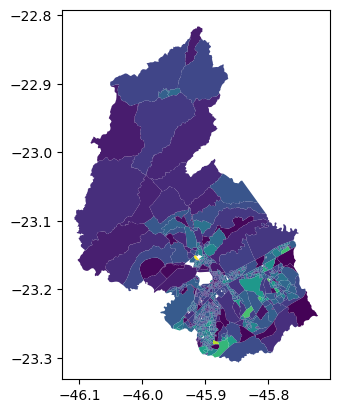

In [ ]:
# Criando um plot rápido para visualizar os dados de população
pop.plot(column="pop")


In [ ]:
# Criando o geo-id necessário para a folium
pop["geoid"]= pop.index.astype(str)

In [ ]:
# Instalando a biblioteca necessaria
!pip install mapclassify==2.4.3 -q

/usr/local/lib/python3.10/dist-packages/mapclassify/classifiers.py:511: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  def _fisher_jenks_means(values, classes=5, sort=True):


<Axes: >

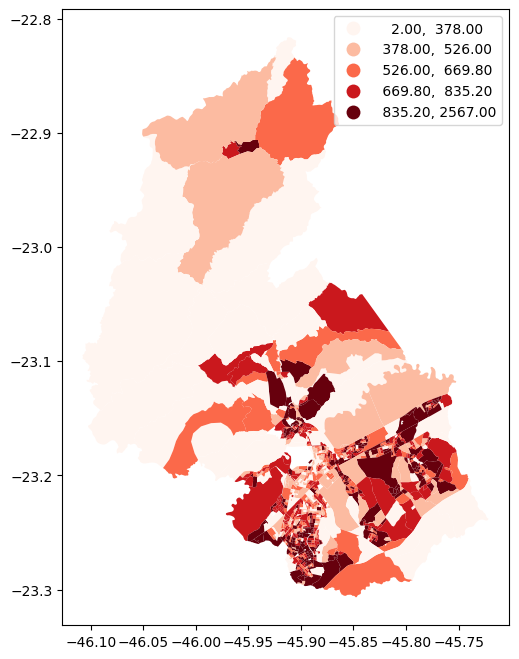

In [ ]:
# Criando figura
fig,ax= plt.subplots(1,figsize=(10,8))

# Crie um novo plot usando classifcação (scheme) por quantis
pop.plot(ax=ax, column="pop",scheme="quantiles",cmap="Reds", legend=True)

In [ ]:
# Criando o geo-id necessário para a folium
pop["geoid"]= pop.index.astype(str)

In [ ]:
# Crie uma instância do tipo mapa
m=folium.Map(location=[-23.1,-45.95], tiles="cartodbpositron", zoom_start=10, control_scale=True)

# Adicione os dados de população como mapa coroplético ao mapa base
folium.Choropleth(geo_data=pop,
             data=pop,
             columns=["geoid","pop"],
             key_on="feature.id",
             fill_color="RdYlBu",
             line_color="grey",
             line_weight=1,
             legend_name="População do setor censitário").add_to(m).geojson.add_child(folium.GeoJsonTooltip(fields=["pop"], aliases=["População"]))

# Visualize o resultado
m